2. Benchmark Unet


---


In [1]:
# os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"
# os.environ["XLA_FLAGS"] = "--xla_gpu_strict_conv_algorithm_picker=false"
# os.environ["TF_XLA_FLAGS"] = "--tf_xla_auto_jit=0"
# os.environ["TF_CUDNN_USE_AUTOTUNE"] = "0"

import os

os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"

os.environ["TF_USE_CUDNN_AUTOTUNE"] = "0"
os.environ["TF_CUDNN_USE_AUTOTUNE"] = "0"

# "1" si PB.
os.environ["TF_CUDNN_USE_FRONTEND"] = "0"

# Désactive le XLA auto-jit
os.environ["TF_XLA_FLAGS"] = "--tf_xla_auto_jit=0"

In [2]:
import tensorflow as tf

tf.config.optimizer.set_jit(False)
tf.config.experimental.enable_op_determinism()

gpus = tf.config.list_physical_devices("GPU")
print("GPUs:", gpus)

if gpus:
    tf.config.set_logical_device_configuration(
        gpus[0], [tf.config.LogicalDeviceConfiguration(memory_limit=9000)]
    )

print("TF:", tf.__version__)

GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
TF: 2.20.0


In [3]:
import sys
from pathlib import Path

PROJECT_ROOT = Path.cwd()
if PROJECT_ROOT.name == "notebooks":
    PROJECT_ROOT = PROJECT_ROOT.parent
sys.path.insert(0, str(PROJECT_ROOT))

from scripts.config import (
    PROJECT_ROOT,
    CITYSCAPES_DIR,
    OUT_DIR,
    EXP_DIR,
    DATA_DIR,
    CSV_SPLIT,
    resolve_split_csv,
    ensure_dirs,
)

ensure_dirs()
print("PROJECT_ROOT:", PROJECT_ROOT)
print("CITYSCAPES_DIR:", CITYSCAPES_DIR)
print("OUT_DIR:", OUT_DIR)
print("EXP_DIR:", EXP_DIR)
print("CSV_SPLIT (raw):", CSV_SPLIT)
print("CSV_SPLIT (resolved):", resolve_split_csv())

PROJECT_ROOT: /home/ui/PROJ8
CITYSCAPES_DIR: /home/ui/PROJ8/data/raw/cityscapes
OUT_DIR: /home/ui/PROJ8/out
EXP_DIR: /home/ui/PROJ8/out/experiments
CSV_SPLIT (raw): /home/ui/PROJ8/out/cityscapes_split_testXtrainXval.csv
CSV_SPLIT (resolved): /home/ui/PROJ8/out/cityscapes_split_testXtrainXval.csv


In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

from scripts.augmentations import make_train_aug
from scripts.datagen import CityscapesSequence
from scripts.preprocessing import (
    remap_to_groups,
    colorize_groups,
    overlay,
    IGNORE_LABEL,
    N_CLASSES,
    CATEGORY_NAMES,
)
from scripts.losses_metrics import MeanIoUArgmax, dice_loss_sparse
from scripts.training import run_unet_scratch, reset_between_runs

In [ ]:
csv_path = resolve_split_csv()
df_idx = pd.read_csv(csv_path)

df_idx["image_path"] = df_idx["image_rel"].apply(lambda p: str(CITYSCAPES_DIR / p))
df_idx["mask_path"] = df_idx["mask_rel"].apply(lambda p: str(CITYSCAPES_DIR / p))

print(df_idx["split_final"].value_counts())

train_df = df_idx[df_idx["split_final"] == "train"].copy()
val_df = df_idx[df_idx["split_final"] == "val"].copy()
test_df = df_idx[df_idx["split_final"] == "test"].copy()
print(len(train_df), len(val_df), len(test_df))

split_final
train    2380
test      595
val       500
Name: count, dtype: int64
2380 500 595


/home/ui/PROJ8/scripts/augmentations.py:15: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(5.0, 20.0), p=0.2),
/home/ui/PROJ8/.venv2/lib/python3.11/site-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


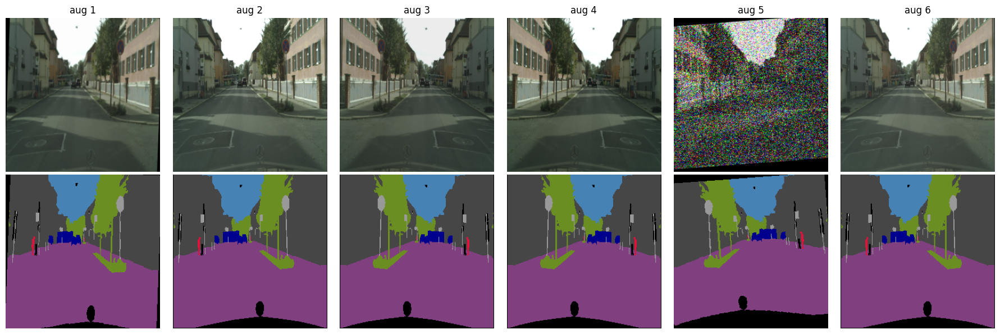

In [6]:
import albumentations as A

aug = make_train_aug()

row = train_df.sample(1, random_state=42).iloc[0]
img = Image.open(row["image_path"]).convert("RGB")
mask = remap_to_groups(Image.open(row["mask_path"]))

img = img.resize((256, 256), Image.BILINEAR)
mask = mask.resize((256, 256), Image.NEAREST)

img_np = np.array(img)
mask_np = np.array(mask, dtype=np.uint8)

N = 6
fig, ax = plt.subplots(2, N, figsize=(3 * N, 6))
for i in range(N):
    out = aug(image=img_np, mask=mask_np)
    img_i = Image.fromarray(out["image"])
    m_i = Image.fromarray(out["mask"], mode="L")
    ax[0, i].imshow(img_i)
    ax[0, i].axis("off")
    ax[0, i].set_title(f"aug {i+1}")
    ax[1, i].imshow(colorize_groups(m_i))
    ax[1, i].axis("off")
plt.tight_layout()
plt.show()

In [7]:
import json


def save_history_json(hist_dict, path: Path):
    path.parent.mkdir(parents=True, exist_ok=True)
    with open(path, "w") as f:
        json.dump(hist_dict, f, indent=2)


def save_summary_json(summary_dict, path: Path):
    path.parent.mkdir(parents=True, exist_ok=True)
    with open(path, "w") as f:
        json.dump(summary_dict, f, indent=2)


def plot_curves(hist, out_png: Path):
    plt.figure(figsize=(10, 4))
    if "loss" in hist:
        plt.plot(hist["loss"], label="loss")
    if "val_loss" in hist:
        plt.plot(hist["val_loss"], label="val_loss")
    plt.legend()
    plt.title("Loss")
    plt.xlabel("epoch")
    plt.ylabel("loss")
    out_png.parent.mkdir(parents=True, exist_ok=True)
    plt.tight_layout()
    plt.savefig(out_png, dpi=160)
    plt.show()

    plt.figure(figsize=(10, 4))
    key_train = (
        "mIoU" if "mIoU" in hist else ("mean_iou" if "mean_iou" in hist else None)
    )
    key_val = (
        "val_mIoU"
        if "val_mIoU" in hist
        else ("val_mean_iou" if "val_mean_iou" in hist else None)
    )
    if key_train:
        plt.plot(hist[key_train], label=key_train)
    if key_val:
        plt.plot(hist[key_val], label=key_val)
    plt.legend()
    plt.title("Mean IoU")
    plt.xlabel("epoch")
    plt.ylabel("IoU")
    plt.tight_layout()
    plt.savefig(
        out_png.with_name(out_png.stem.replace("loss", "miou") + ".png"), dpi=160
    )
    plt.show()


def visualize_predictions(
    best_model_path: Path, size_hw=(256, 256), n=4, out_png: Path | None = None
):
    custom_objects = {
        "MeanIoUArgmax": MeanIoUArgmax,
        "dice_loss_sparse": dice_loss_sparse,
    }
    model = tf.keras.models.load_model(
        best_model_path, custom_objects=custom_objects, compile=False
    )

    seq = CityscapesSequence(
        test_df,
        base_dir=DATA_DIR,
        batch_size=n,
        size_hw=size_hw,
        augment=None,
        shuffle=False,
    )
    X, y = seq[0]
    pred = model.predict(X, verbose=0)
    pred_cls = np.argmax(pred, axis=-1).astype(np.uint8)

    fig, ax = plt.subplots(n, 4, figsize=(18, 4 * n))
    for i in range(n):
        img = Image.fromarray((X[i] * 255).astype(np.uint8))
        gt = Image.fromarray(y[i, ..., 0].astype(np.uint8), mode="L")
        pr = Image.fromarray(pred_cls[i].astype(np.uint8), mode="L")

        gt_col = colorize_groups(gt)
        pr_col = colorize_groups(pr)

        ax[i, 0].imshow(img)
        ax[i, 0].set_title("RGB")
        ax[i, 0].axis("off")
        ax[i, 1].imshow(gt_col)
        ax[i, 1].set_title("GT")
        ax[i, 1].axis("off")
        ax[i, 2].imshow(pr_col)
        ax[i, 2].set_title("Pred")
        ax[i, 2].axis("off")
        ax[i, 3].imshow(overlay(img, pr_col, 0.45))
        ax[i, 3].set_title("Overlay")
        ax[i, 3].axis("off")
    plt.tight_layout()

    if out_png is not None:
        out_png.parent.mkdir(parents=True, exist_ok=True)
        plt.savefig(out_png, dpi=160)
    plt.show()

In [8]:
RUNS = [
    dict(
        size_hw=(128, 128), batch=8, epochs=5, aug=False, aug_repeats=1, loss_name="ce"
    ),
    dict(
        size_hw=(128, 128), batch=8, epochs=10, aug=True, aug_repeats=1, loss_name="ce"
    ),
    dict(
        size_hw=(256, 256), batch=4, epochs=5, aug=False, aug_repeats=1, loss_name="ce"
    ),
    dict(
        size_hw=(256, 256),
        batch=4,
        epochs=10,
        aug=True,
        aug_repeats=1,
        loss_name="ce_dice",
    ),
]

I0000 00:00:1769983857.181954 1692297 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 9000 MB memory:  -> device: 0, name: NVIDIA GeForce GTX 1080 Ti, pci bus id: 0000:07:00.0, compute capability: 6.1


Epoch 1/5
298/298 ━━━━━━━━━━━━━━━━━━━━ 247s 797ms/step - loss: 0.5836 - mIoU: 0.4941 - val_loss: 0.8114 - val_mIoU: 0.3871 - learning_rate: 0.0010
Epoch 2/5
298/298 ━━━━━━━━━━━━━━━━━━━━ 233s 781ms/step - loss: 0.4280 - mIoU: 0.5761 - val_loss: 0.4818 - val_mIoU: 0.5469 - learning_rate: 0.0010
Epoch 3/5
298/298 ━━━━━━━━━━━━━━━━━━━━ 235s 778ms/step - loss: 0.3821 - mIoU: 0.6099 - val_loss: 0.4255 - val_mIoU: 0.5922 - learning_rate: 0.0010
Epoch 4/5
298/298 ━━━━━━━━━━━━━━━━━━━━ 231s 774ms/step - loss: 0.3535 - mIoU: 0.6306 - val_loss: 0.4422 - val_mIoU: 0.5851 - learning_rate: 0.0010
Epoch 5/5
298/298 ━━━━━━━━━━━━━━━━━━━━ 236s 779ms/step - loss: 0.3275 - mIoU: 0.6496 - val_loss: 0.3678 - val_mIoU: 0.6281 - learning_rate: 0.0010


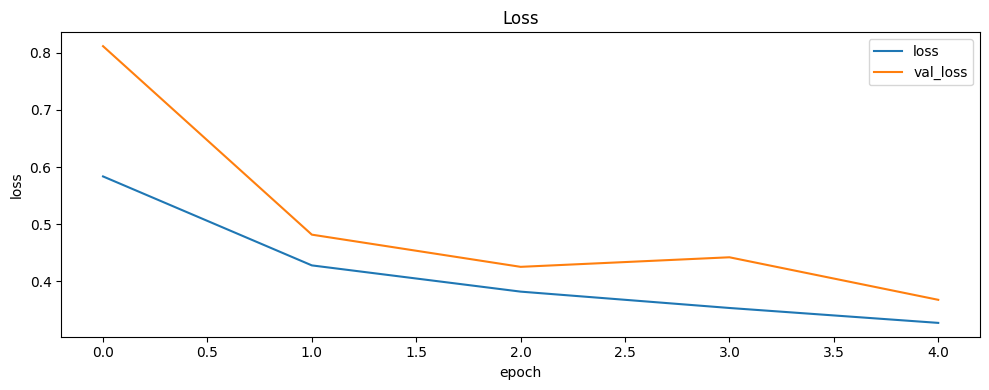

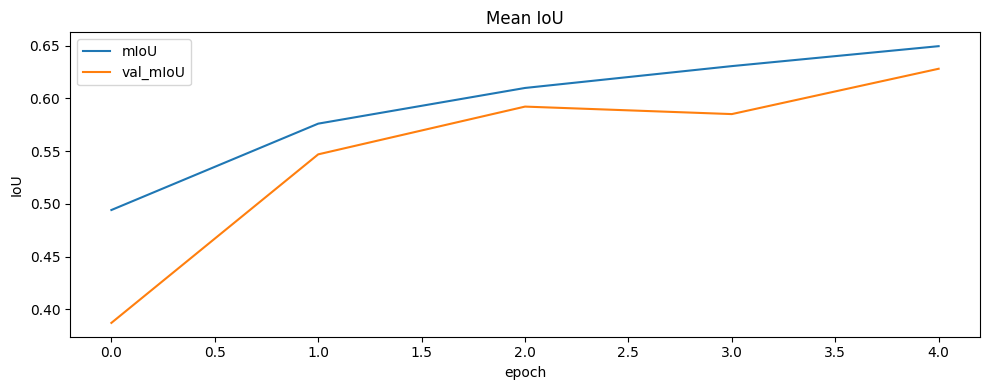

2026-02-01 23:32:14.012072: E tensorflow/core/framework/node_def_util.cc:680] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_14}}


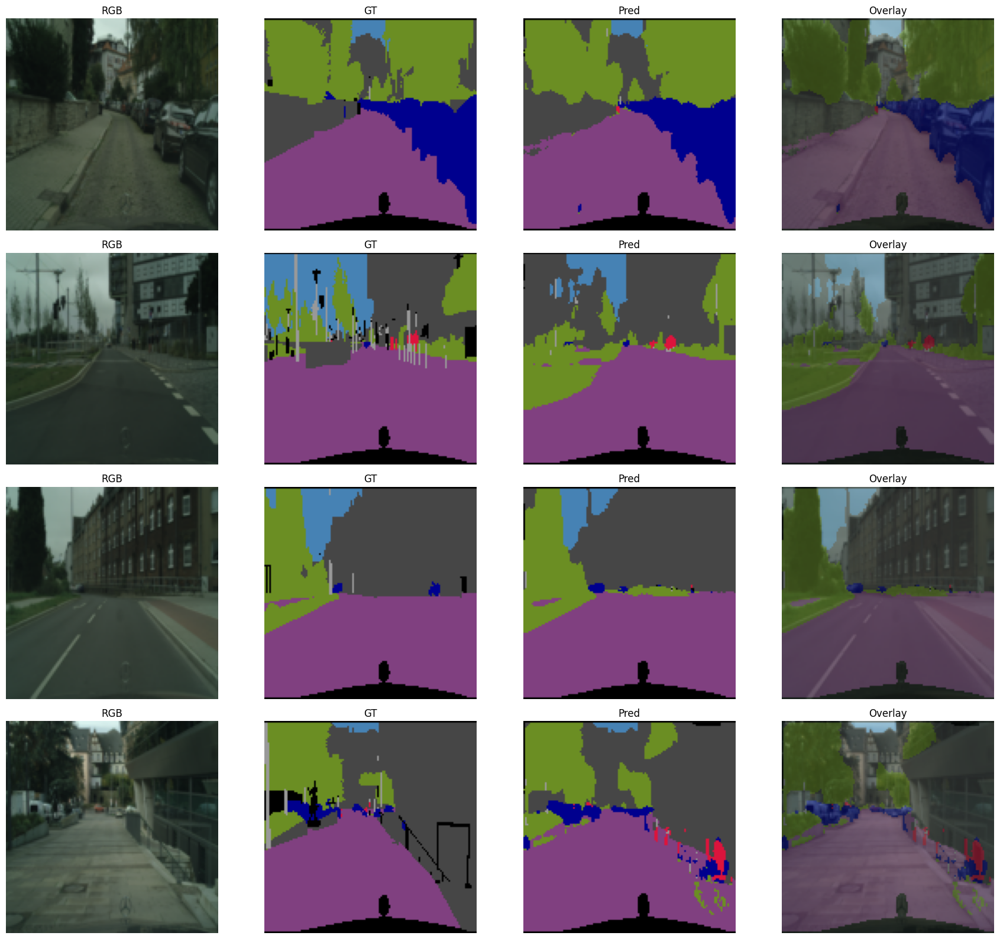

Epoch 1/10
298/298 ━━━━━━━━━━━━━━━━━━━━ 250s 813ms/step - loss: 0.7702 - mIoU: 0.4127 - val_loss: 0.7071 - val_mIoU: 0.4067 - learning_rate: 0.0010
Epoch 2/10
298/298 ━━━━━━━━━━━━━━━━━━━━ 237s 797ms/step - loss: 0.5943 - mIoU: 0.4803 - val_loss: 0.6064 - val_mIoU: 0.4802 - learning_rate: 0.0010
Epoch 3/10
298/298 ━━━━━━━━━━━━━━━━━━━━ 234s 787ms/step - loss: 0.5453 - mIoU: 0.5110 - val_loss: 0.5080 - val_mIoU: 0.5434 - learning_rate: 0.0010
Epoch 4/10
298/298 ━━━━━━━━━━━━━━━━━━━━ 233s 782ms/step - loss: 0.5112 - mIoU: 0.5305 - val_loss: 0.4715 - val_mIoU: 0.5613 - learning_rate: 0.0010
Epoch 5/10
298/298 ━━━━━━━━━━━━━━━━━━━━ 240s 806ms/step - loss: 0.4882 - mIoU: 0.5442 - val_loss: 0.4523 - val_mIoU: 0.5719 - learning_rate: 0.0010
Epoch 6/10
298/298 ━━━━━━━━━━━━━━━━━━━━ 235s 790ms/step - loss: 0.4680 - mIoU: 0.5578 - val_loss: 0.4905 - val_mIoU: 0.5607 - learning_rate: 0.0010
Epoch 7/10
298/298 ━━━━━━━━━━━━━━━━━━━━ 233s 783ms/step - loss: 0.4594 - mIoU: 0.5661 - val_loss: 0.4541 - val_m

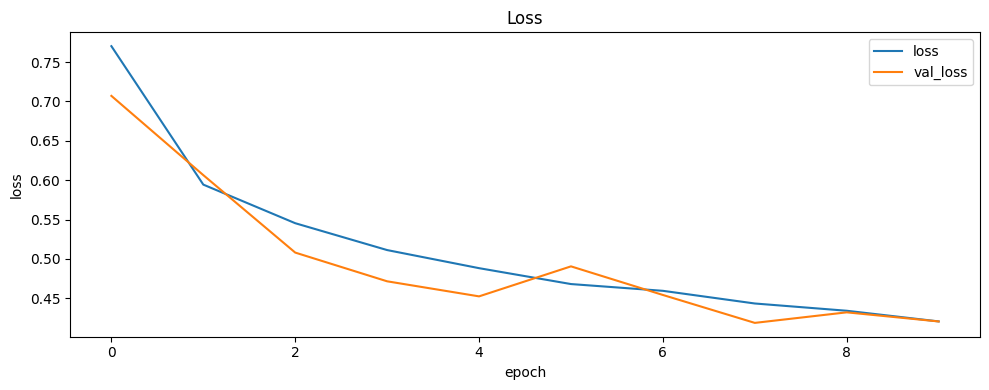

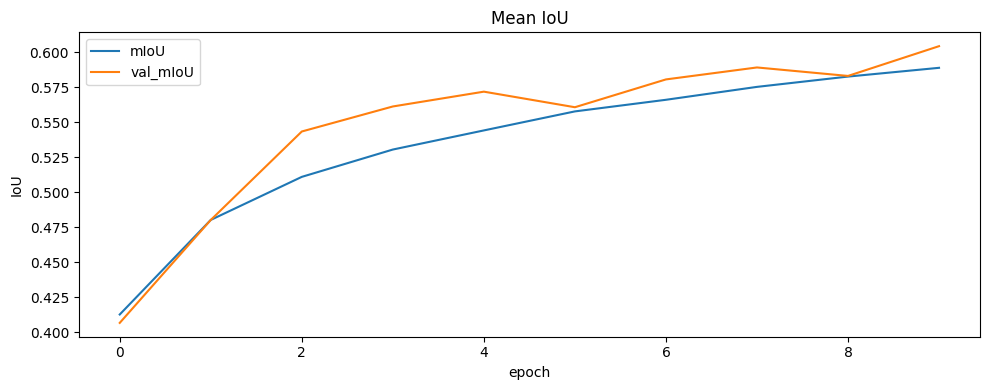

2026-02-02 00:13:13.025002: E tensorflow/core/framework/node_def_util.cc:680] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_14}}


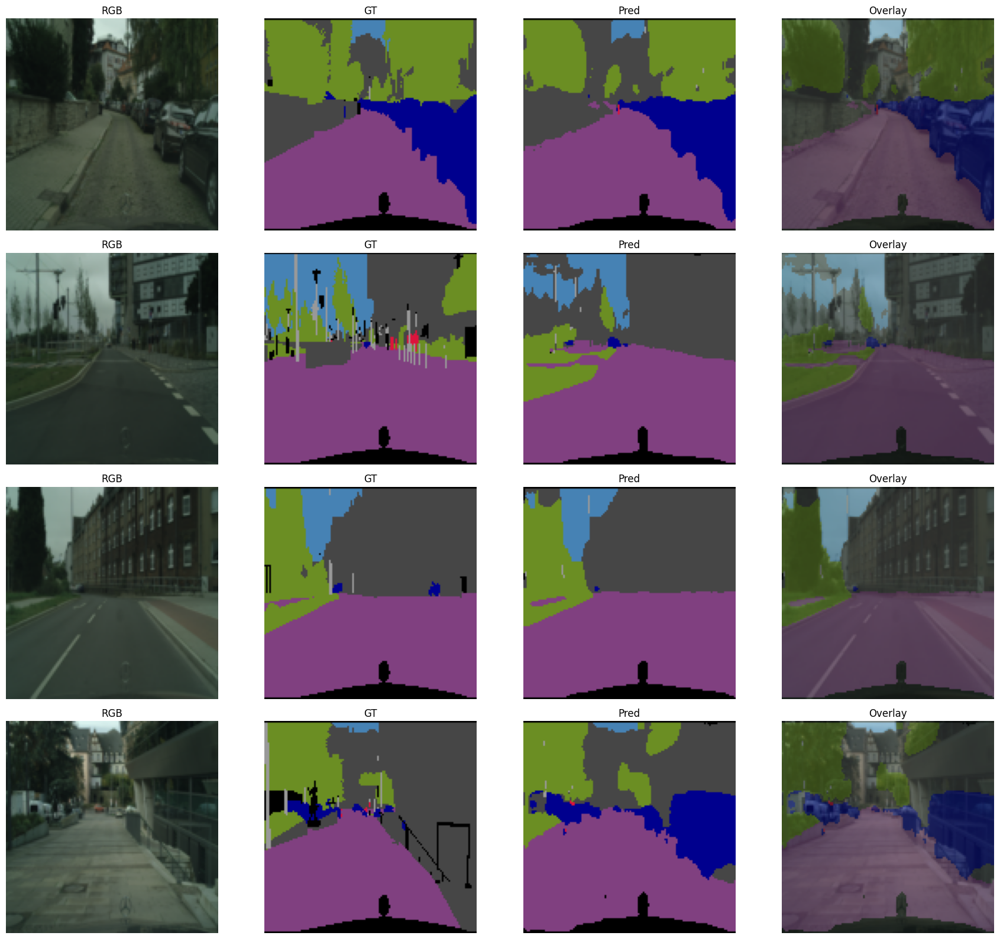

Epoch 1/5
595/595 ━━━━━━━━━━━━━━━━━━━━ 303s 490ms/step - loss: 0.5989 - mIoU: 0.4813 - val_loss: 0.5407 - val_mIoU: 0.5223 - learning_rate: 0.0010
Epoch 2/5
595/595 ━━━━━━━━━━━━━━━━━━━━ 292s 491ms/step - loss: 0.4123 - mIoU: 0.5821 - val_loss: 0.5308 - val_mIoU: 0.5540 - learning_rate: 0.0010
Epoch 3/5
595/595 ━━━━━━━━━━━━━━━━━━━━ 289s 486ms/step - loss: 0.3584 - mIoU: 0.6277 - val_loss: 0.4196 - val_mIoU: 0.6092 - learning_rate: 0.0010
Epoch 4/5
595/595 ━━━━━━━━━━━━━━━━━━━━ 291s 490ms/step - loss: 0.3213 - mIoU: 0.6569 - val_loss: 0.3453 - val_mIoU: 0.6477 - learning_rate: 0.0010
Epoch 5/5
595/595 ━━━━━━━━━━━━━━━━━━━━ 291s 489ms/step - loss: 0.3018 - mIoU: 0.6732 - val_loss: 0.3709 - val_mIoU: 0.6311 - learning_rate: 0.0010


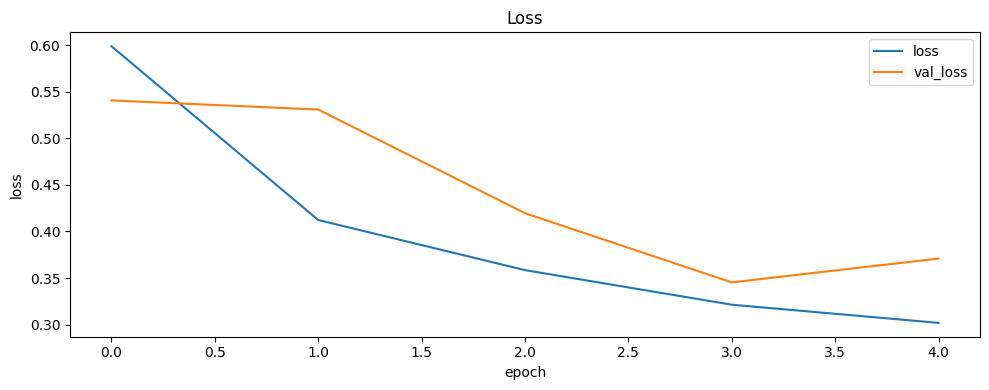

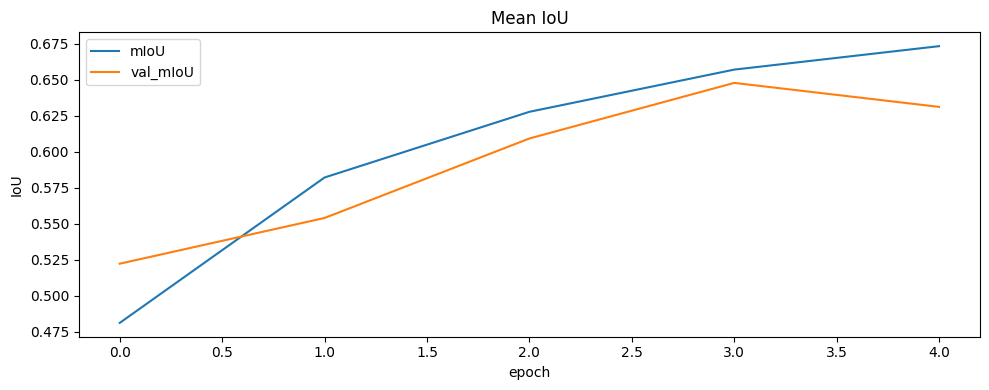

2026-02-02 00:39:13.030319: E tensorflow/core/framework/node_def_util.cc:680] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_14}}


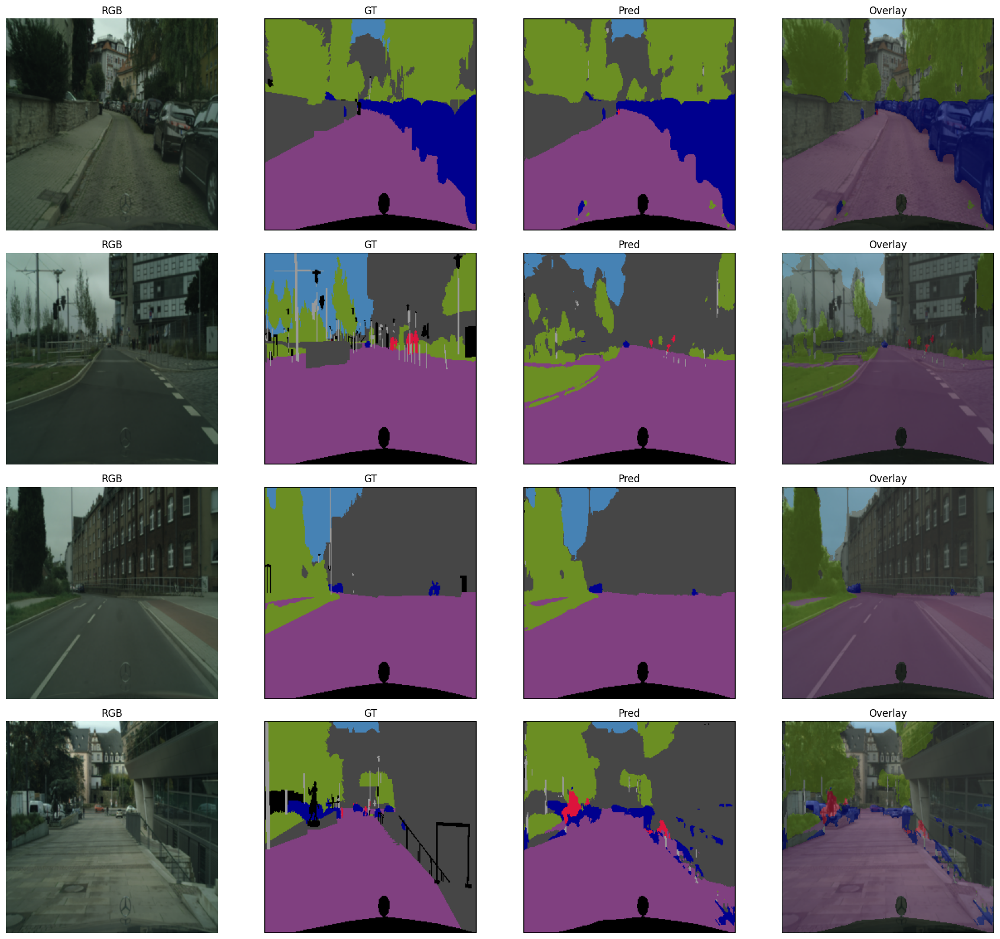

Epoch 1/10
595/595 ━━━━━━━━━━━━━━━━━━━━ 302s 494ms/step - loss: 1.0373 - mIoU: 0.4177 - val_loss: 1.0315 - val_mIoU: 0.4201 - learning_rate: 0.0010
Epoch 2/10
595/595 ━━━━━━━━━━━━━━━━━━━━ 298s 502ms/step - loss: 0.7796 - mIoU: 0.5157 - val_loss: 0.6832 - val_mIoU: 0.5685 - learning_rate: 0.0010
Epoch 3/10
595/595 ━━━━━━━━━━━━━━━━━━━━ 297s 500ms/step - loss: 0.7117 - mIoU: 0.5514 - val_loss: 0.6604 - val_mIoU: 0.5863 - learning_rate: 0.0010
Epoch 4/10
595/595 ━━━━━━━━━━━━━━━━━━━━ 293s 493ms/step - loss: 0.6588 - mIoU: 0.5800 - val_loss: 0.5960 - val_mIoU: 0.6005 - learning_rate: 0.0010
Epoch 5/10
595/595 ━━━━━━━━━━━━━━━━━━━━ 294s 494ms/step - loss: 0.6265 - mIoU: 0.5987 - val_loss: 0.5592 - val_mIoU: 0.6395 - learning_rate: 0.0010
Epoch 6/10
595/595 ━━━━━━━━━━━━━━━━━━━━ 295s 496ms/step - loss: 0.5940 - mIoU: 0.6134 - val_loss: 0.5347 - val_mIoU: 0.6511 - learning_rate: 0.0010
Epoch 7/10
595/595 ━━━━━━━━━━━━━━━━━━━━ 298s 501ms/step - loss: 0.5739 - mIoU: 0.6256 - val_loss: 0.5338 - val_m

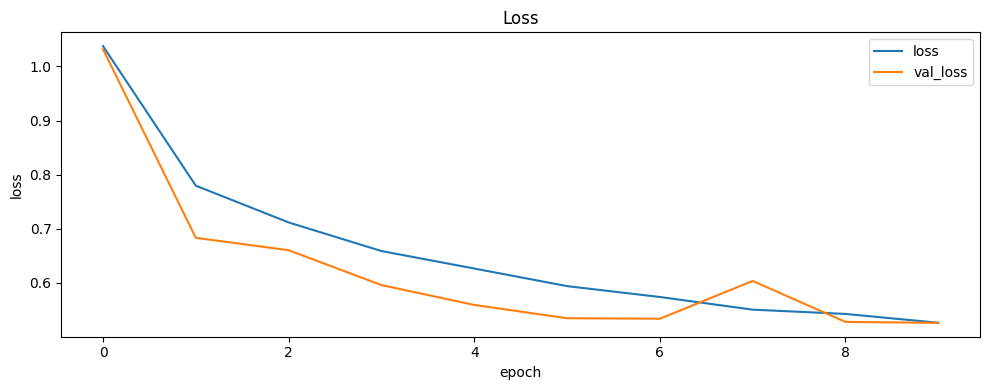

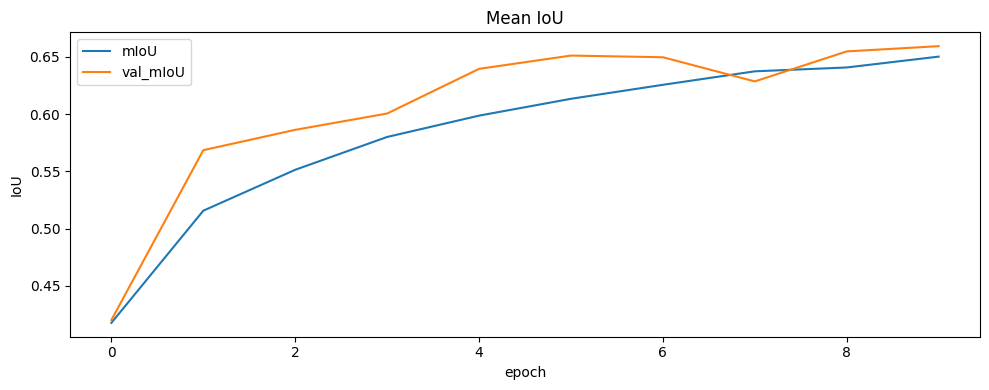

2026-02-02 01:30:18.088682: E tensorflow/core/framework/node_def_util.cc:680] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_14}}


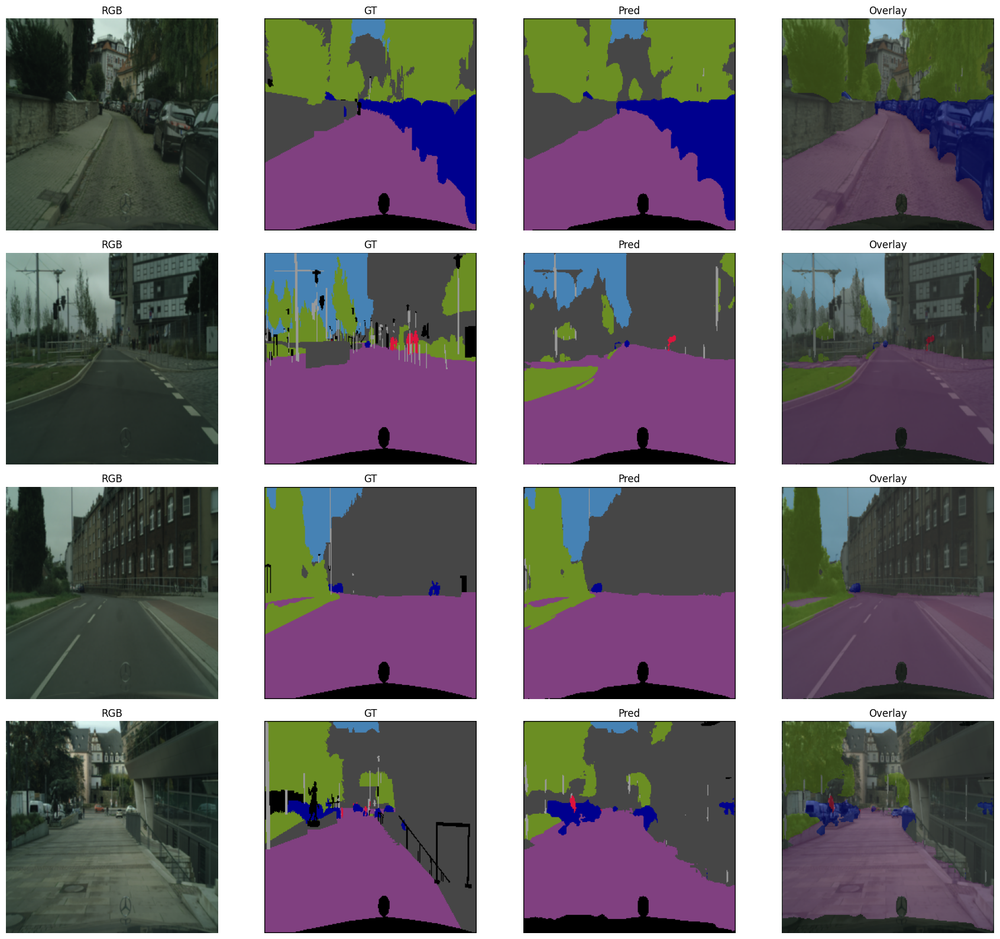

In [9]:
all_res = []
for cfg in RUNS:
    res = run_unet_scratch(
        df_idx=df_idx,
        base_dir=DATA_DIR,
        size_hw=cfg["size_hw"],
        batch=cfg["batch"],
        epochs=cfg["epochs"],
        aug=cfg["aug"],
        aug_repeats=cfg["aug_repeats"],
        loss_name=cfg["loss_name"],
        patience=6,
        out_dir=EXP_DIR,
        seed=42,
    )
    all_res.append(res)

    run_folder = EXP_DIR / res["run_name"]
    run_folder.mkdir(parents=True, exist_ok=True)

    save_summary_json(
        {k: v for k, v in res.items() if k != "history"}, run_folder / "summary.json"
    )
    save_history_json(res["history"], run_folder / "history.json")
    plot_curves(res["history"], run_folder / "loss.png")
    visualize_predictions(
        Path(res["best_path"]),
        size_hw=cfg["size_hw"],
        n=4,
        out_png=run_folder / "pred_grid.png",
    )

In [10]:
import pandas as pd

df_bench = pd.DataFrame(
    [{k: v for k, v in r.items() if k != "history"} for r in all_res]
)
df_bench = df_bench.sort_values("val_mIoU", ascending=False).reset_index(drop=True)
df_bench

,run_name,best_path,train_time_sec,val_loss,val_mIoU,test_loss,test_mIoU
0,UNET_SCRATCH_256x256_b4_aug1_rep1_ce_dice_e10_...,/home/ui/PROJ8/out/experiments/UNET_SCRATCH_25...,2958.684039,0.526105,0.659336,0.470325,0.681464
1,UNET_SCRATCH_256x256_b4_aug0_rep1_ce_e5_seed42,/home/ui/PROJ8/out/experiments/UNET_SCRATCH_25...,1466.444567,0.345296,0.647726,0.314343,0.671014
2,UNET_SCRATCH_128x128_b8_aug0_rep1_ce_e5_seed42,/home/ui/PROJ8/out/experiments/UNET_SCRATCH_12...,1182.343772,0.367822,0.628136,0.335990,0.648802
3,UNET_SCRATCH_128x128_b8_aug1_rep1_ce_e10_seed42,/home/ui/PROJ8/out/experiments/UNET_SCRATCH_12...,2367.653148,0.420473,0.604361,0.377895,0.630923


/home/ui/PROJ8/scripts/augmentations.py:15: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(5.0, 20.0), p=0.2),
/home/ui/PROJ8/.venv2/lib/python3.11/site-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


Epoch 1/40
595/595 ━━━━━━━━━━━━━━━━━━━━ 306s 496ms/step - loss: 1.0404 - mIoU: 0.4186 - val_loss: 0.8149 - val_mIoU: 0.5005 - learning_rate: 0.0010
Epoch 2/40
595/595 ━━━━━━━━━━━━━━━━━━━━ 293s 493ms/step - loss: 0.7896 - mIoU: 0.5075 - val_loss: 0.6887 - val_mIoU: 0.5594 - learning_rate: 0.0010
Epoch 3/40
595/595 ━━━━━━━━━━━━━━━━━━━━ 296s 494ms/step - loss: 0.7115 - mIoU: 0.5505 - val_loss: 0.6806 - val_mIoU: 0.5825 - learning_rate: 0.0010
Epoch 4/40
595/595 ━━━━━━━━━━━━━━━━━━━━ 295s 495ms/step - loss: 0.6581 - mIoU: 0.5804 - val_loss: 0.5945 - val_mIoU: 0.6235 - learning_rate: 0.0010
Epoch 5/40
595/595 ━━━━━━━━━━━━━━━━━━━━ 294s 494ms/step - loss: 0.6205 - mIoU: 0.5990 - val_loss: 0.6183 - val_mIoU: 0.6176 - learning_rate: 0.0010
Epoch 6/40
595/595 ━━━━━━━━━━━━━━━━━━━━ 299s 503ms/step - loss: 0.5995 - mIoU: 0.6117 - val_loss: 0.6477 - val_mIoU: 0.5977 - learning_rate: 0.0010
Epoch 7/40
595/595 ━━━━━━━━━━━━━━━━━━━━ 295s 496ms/step - loss: 0.5794 - mIoU: 0.6224 - val_loss: 0.5750 - val_m

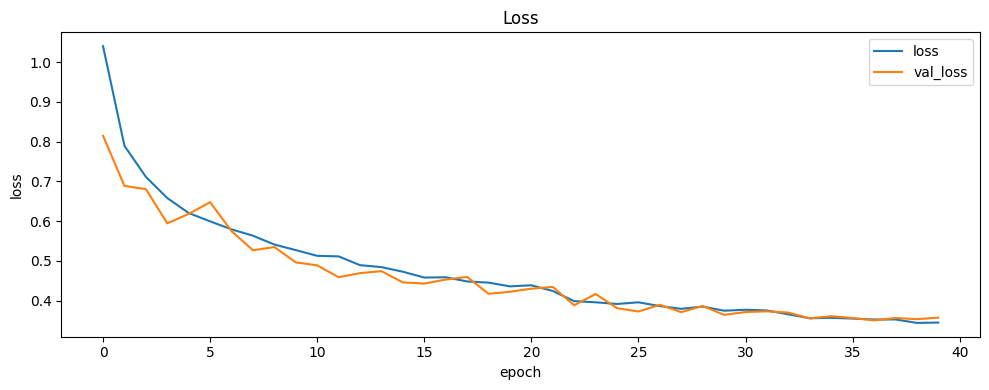

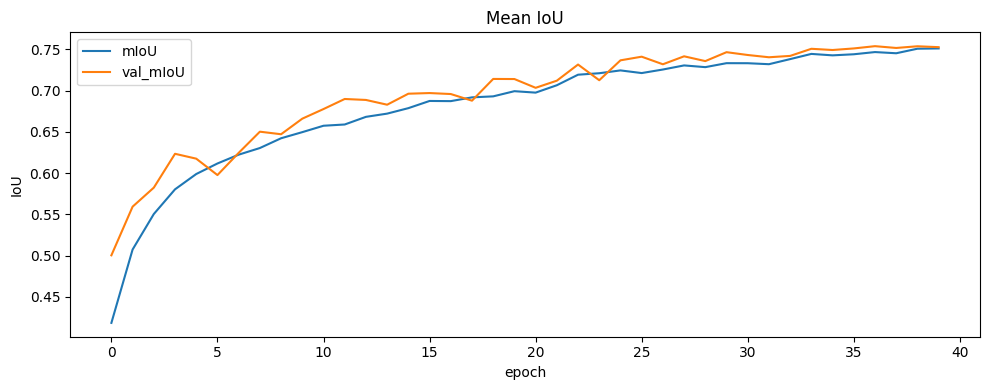

2026-02-02 04:50:52.878402: E tensorflow/core/framework/node_def_util.cc:680] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_14}}


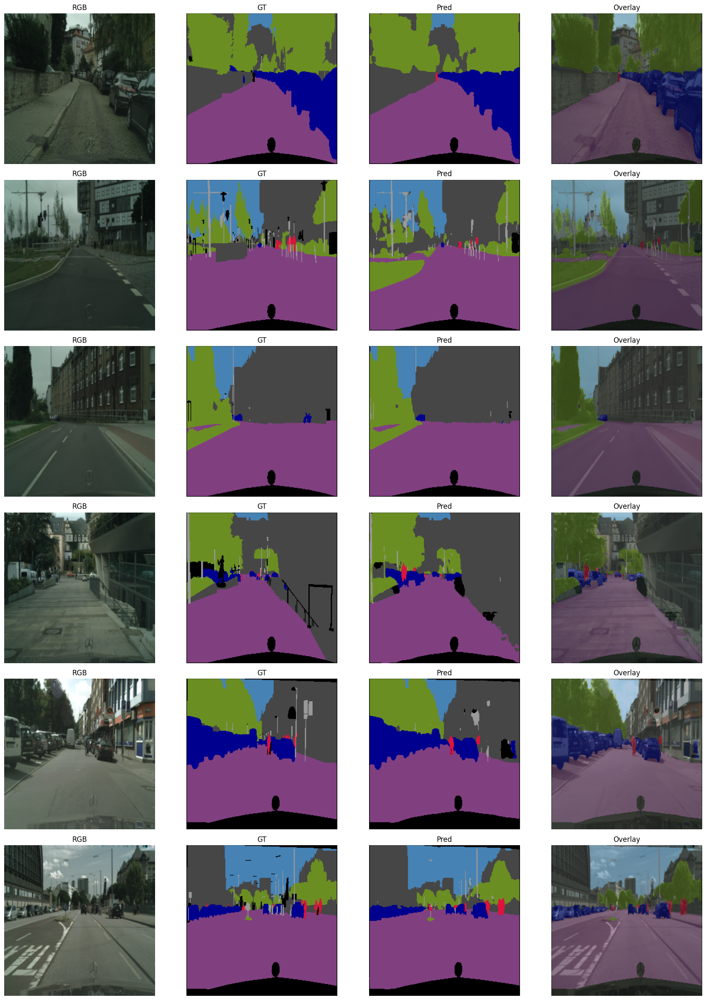

'/home/ui/PROJ8/out/experiments/UNET_SCRATCH_256x256_b4_aug1_rep1_ce_dice_e40_seed42.keras'

In [11]:
res_final_scratch = run_unet_scratch(
    df_idx=df_idx,
    base_dir=DATA_DIR,
    size_hw=(256, 256),
    batch=4,
    epochs=40,
    aug=True,
    aug_repeats=1,
    loss_name="ce_dice",
    patience=8,
    out_dir=EXP_DIR,
    seed=42,
)

folder = EXP_DIR / res_final_scratch["run_name"]
folder.mkdir(parents=True, exist_ok=True)
save_summary_json(
    {k: v for k, v in res_final_scratch.items() if k != "history"},
    folder / "summary.json",
)
save_history_json(res_final_scratch["history"], folder / "history.json")
plot_curves(res_final_scratch["history"], folder / "loss.png")
visualize_predictions(
    Path(res_final_scratch["best_path"]),
    size_hw=(256, 256),
    n=6,
    out_png=folder / "pred_grid.png",
)

res_final_scratch["best_path"]